In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
import os
import numpy as np

In [ ]:
from flask import Flask, request, jsonify
import numpy as np
import cv2
from tensorflow.keras.models import load_model

app = Flask(__name__)

model = load_model('/content/drive/MyDrive/model.h5')
model.load_weights('/content/drive/MyDrive/my_model_weights.h5')

label_mapping = {0: 'Hoa cuc', 1: 'Phong lan', 2: 'Hoa hong', 3: 'Huong duong'}

@app.route('/predict-plant/<path:image_path>', methods=['POST'])
def predict_plant(image_path):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (200, 200))
    img = np.expand_dims(img, axis=0)

    prediction = model.predict(img)

    predicted_class = np.argmax(prediction)
    predicted_label = label_mapping[predicted_class]
    print (predicted_label)

    return jsonify({'prediction': predicted_label})

@app.route('/hello', methods=['GET'])
def hello():
    return jsonify({'message': 'Hello, this is a GET request!'})

if __name__ == '__main__':
    app.run(debug=True)


 * Serving Flask app '__main__'
 * Debug mode: on


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit
INFO:werkzeug: * Restarting with stat


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
train = ImageDataGenerator(rescale=1./255, shear_range = 0.2, zoom_range = 0.2, horizontal_flip = True)
validation = ImageDataGenerator(rescale=1./255)


In [ ]:
train_dataset = train.flow_from_directory('/content/drive/MyDrive/dataset2/train/',
                                          target_size=(200, 200),
                                          batch_size = 6,
                                          class_mode = 'categorical')
validation_dataset = validation.flow_from_directory('/content/drive/MyDrive/dataset2/validation/',
                                                    target_size=(200, 200),
                                                    batch_size = 3,
                                                    class_mode = 'categorical')
labels = (train_dataset.class_indices)
print(labels)

Found 66 images belonging to 4 classes.
Found 50 images belonging to 4 classes.
{'Chrysanthemum': 0, 'Orchid': 1, 'Rose': 2, 'Sunflower': 3}


In [ ]:
model = tf.keras.models.Sequential(
    [tf.keras.layers.Conv2D(16, (3, 3), activation='relu', input_shape=(200, 200, 3)),
     tf.keras.layers.MaxPool2D(2, 2),

     tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
     tf.keras.layers.MaxPool2D(2, 2),

     tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
     tf.keras.layers.MaxPool2D(2, 2),

     tf.keras.layers.Flatten(),
     tf.keras.layers.Dense(128, activation='relu'),
     tf.keras.layers.Dense(4, activation='softmax')
    ]
)

model.compile(loss='categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

model_fit = model.fit(train_dataset, steps_per_epoch = 11, epochs = 20, validation_data=validation_dataset)


Epoch 1/20
11/11 [==============================] - 14s 1s/step - loss: 1.7332 - accuracy: 0.3636 - val_loss: 1.3710 - val_accuracy: 0.2600
Epoch 2/20
11/11 [==============================] - 12s 1s/step - loss: 1.1744 - accuracy: 0.4242 - val_loss: 1.0379 - val_accuracy: 0.5200
Epoch 3/20
11/11 [==============================] - 11s 971ms/step - loss: 0.9261 - accuracy: 0.6364 - val_loss: 0.8957 - val_accuracy: 0.6400
Epoch 4/20
11/11 [==============================] - 12s 1s/step - loss: 0.6814 - accuracy: 0.8030 - val_loss: 0.7527 - val_accuracy: 0.7200
Epoch 5/20
11/11 [==============================] - 11s 899ms/step - loss: 0.5781 - accuracy: 0.7424 - val_loss: 1.3965 - val_accuracy: 0.5800
Epoch 6/20
11/11 [==============================] - 10s 963ms/step - loss: 0.6091 - accuracy: 0.7576 - val_loss: 0.7242 - val_accuracy: 0.7800
Epoch 7/20
11/11 [==============================] - 13s 1s/step - loss: 0.4650 - accuracy: 0.8333 - val_loss: 1.0515 - val_accuracy: 0.7000
Epoch 8/20


In [ ]:
classifier_json=model.to_json()
with open("/content/drive/MyDrive/model.json", "w") as json_file:
    json_file.write(classifier_json)
# serialize weights to HDF5
model.save_weights("/content/drive/MyDrive/my_model_weights.h5")
model.save("/content/drive/MyDrive/model.h5")
print("Saved model to disk")

Saved model to disk


In [ ]:
from zipfile import ZipFile
import os

# Thay đổi thư mục đến nơi lưu trữ file
os.chdir('/content/')

# Danh sách các file cần nén
file_list = ['model.json', 'my_model_weights.h5', 'model.h5']

# Tạo file zip
with ZipFile('model_files.zip','w') as zip:
  for file in file_list:
    zip.write(file)

# Tải file zip về máy của bạn
from google.colab import files
files.download('model_files.zip')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

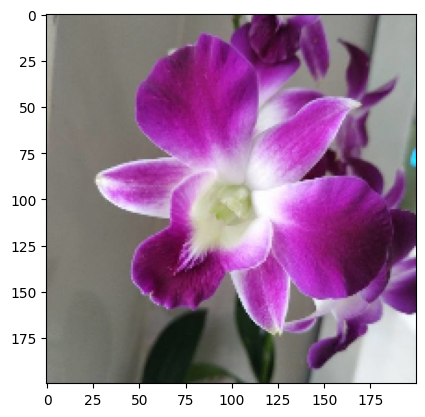

1/1 [==============================] - 0s 152ms/step
7.jpg được dự đoán là: phong lan


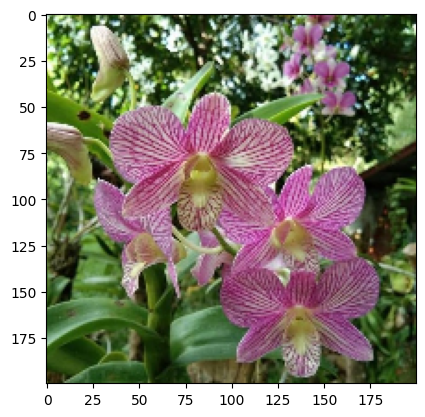

1/1 [==============================] - 0s 51ms/step
2.jpg được dự đoán là: phong lan


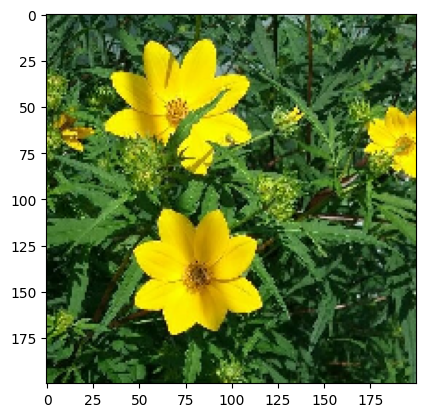

1/1 [==============================] - 0s 47ms/step
15.jpg được dự đoán là: hoa cuc


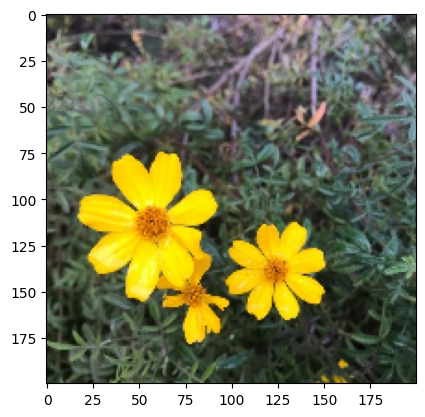

1/1 [==============================] - 0s 74ms/step
10.jpg được dự đoán là: hoa cuc


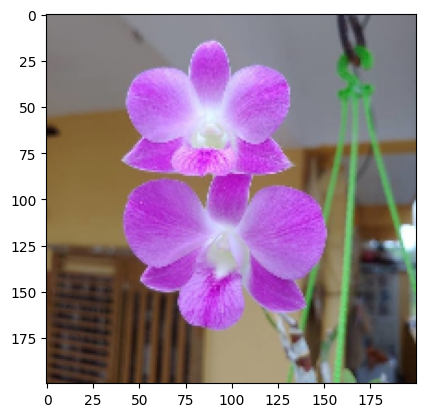

1/1 [==============================] - 0s 57ms/step
6.jpg được dự đoán là: phong lan


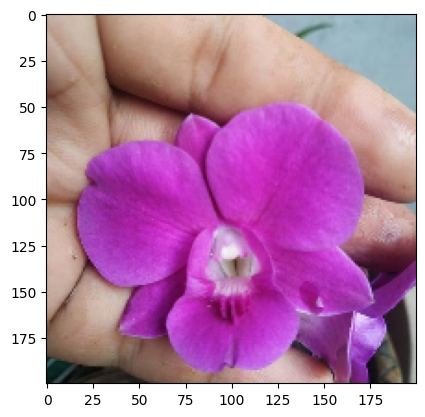

1/1 [==============================] - 0s 50ms/step
8.jpg được dự đoán là: phong lan


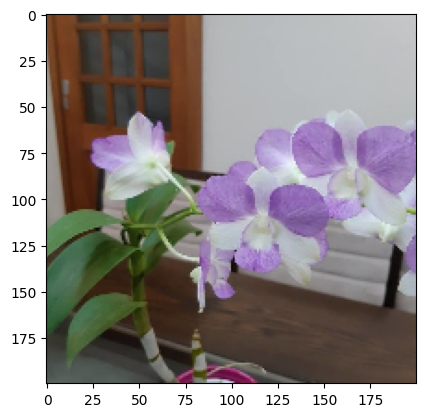

1/1 [==============================] - 0s 33ms/step
1.jpg được dự đoán là: phong lan


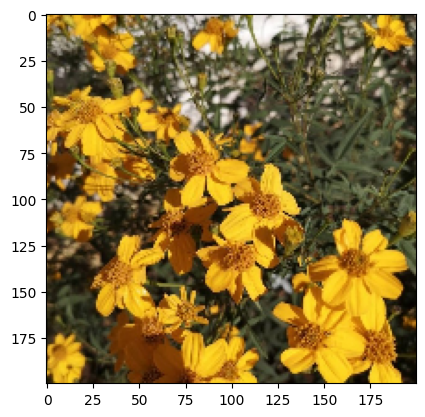

1/1 [==============================] - 0s 56ms/step
4.jpg được dự đoán là: hoa cuc


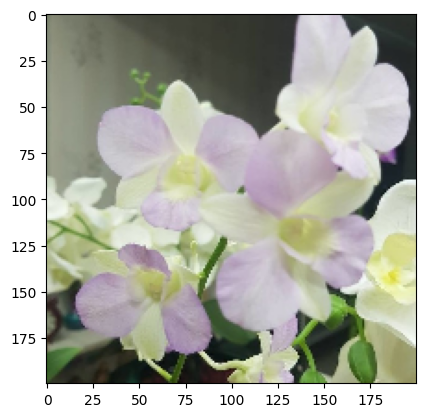

1/1 [==============================] - 0s 37ms/step
3.jpg được dự đoán là: phong lan


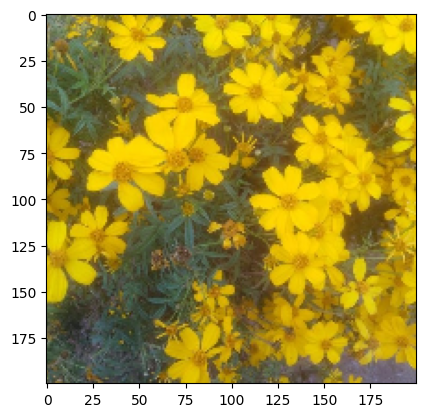

1/1 [==============================] - 0s 66ms/step
9.jpg được dự đoán là: hoa cuc


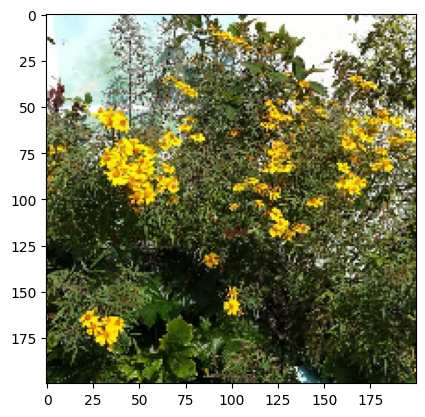

1/1 [==============================] - 0s 81ms/step
12.jpg được dự đoán là: hoa cuc


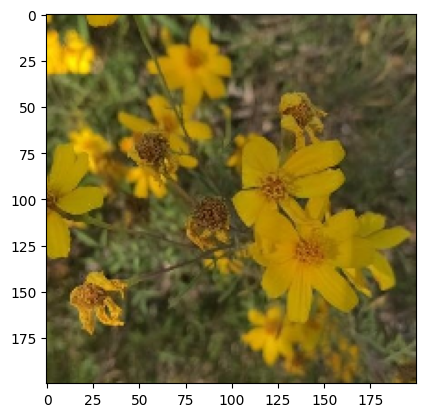

1/1 [==============================] - 0s 133ms/step
5.jpg được dự đoán là: hoa cuc


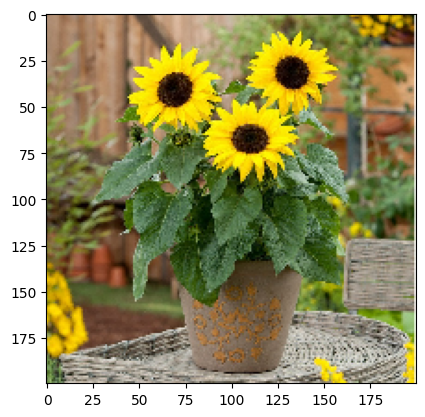

1/1 [==============================] - 0s 46ms/step
18.jpg được dự đoán là: huong duong


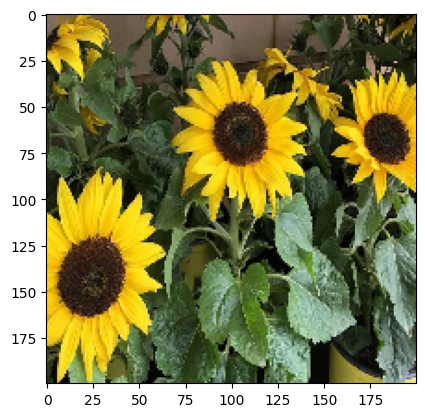

1/1 [==============================] - 0s 52ms/step
14.jpg được dự đoán là: hoa cuc


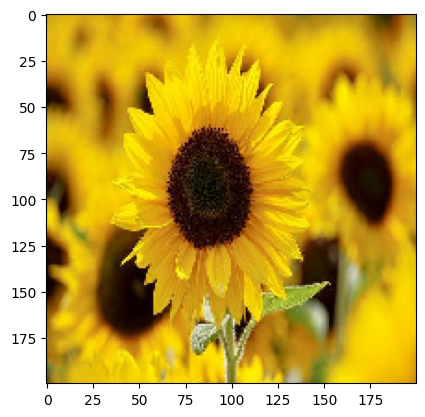

1/1 [==============================] - 0s 50ms/step
19.jpg được dự đoán là: hoa cuc


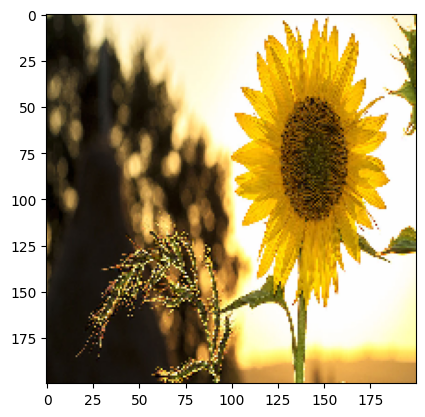

1/1 [==============================] - 0s 48ms/step
13.jpg được dự đoán là: hoa cuc


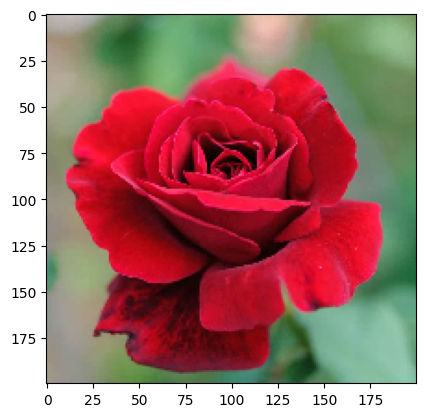

1/1 [==============================] - 0s 57ms/step
11.jpg được dự đoán là: hoa hong


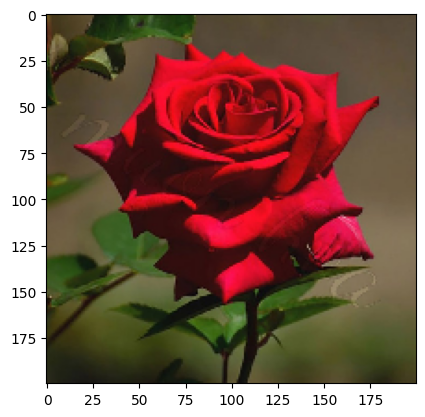

1/1 [==============================] - 0s 50ms/step
21.jpg được dự đoán là: hoa hong


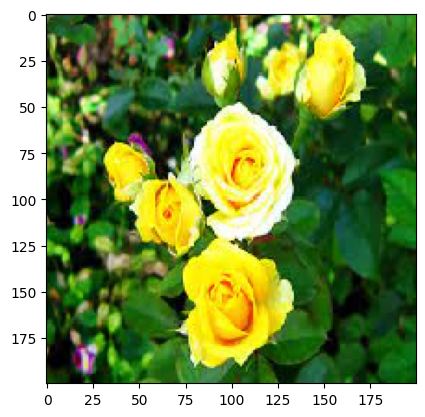

1/1 [==============================] - 0s 56ms/step
20.jpg được dự đoán là: hoa cuc


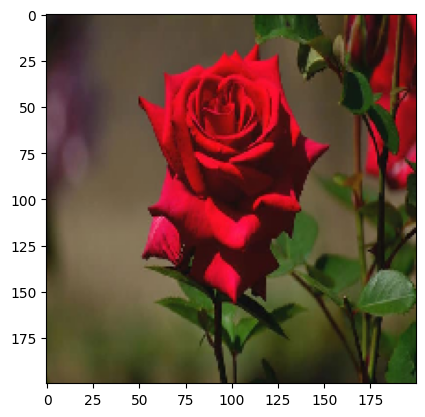

1/1 [==============================] - 0s 47ms/step
17.jpg được dự đoán là: hoa hong


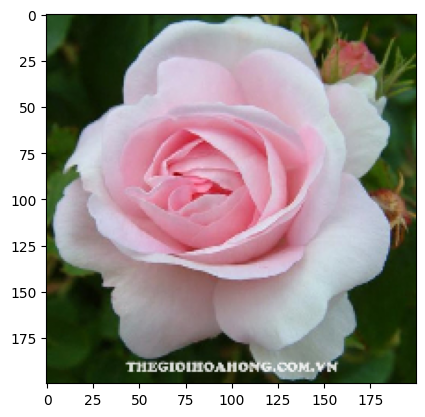

1/1 [==============================] - 0s 48ms/step
16.jpg được dự đoán là: phong lan


In [ ]:
import tkinter as tk
from tkinter import filedialog
from PIL import Image, ImageTk
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import numpy as np
import cv2

# Load mô hình
model = load_model('/content/drive/MyDrive/model.h5')
model.load_weights('/content/drive/MyDrive/my_model_weights.h5')

label_mapping = {0: 'Hoa cuc', 1: 'Phong lan', 2: 'Hoa hong', 3: 'Huong duong'}  # Thay thế bằng mapping của các class trong mô hình của bạn

def predict(image_path):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (200, 200))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    prediction = model.predict(img)

    predicted_class = np.argmax(prediction)  # Lấy class có xác suất cao nhất
    predicted_label = label_mapping[predicted_class]  # Lấy label tương ứng với class

    return predicted_label  # Trả về label dự đoán

dir_path = '/content/drive/MyDrive/dataset2/test'

for i in os.listdir(dir_path):
    img = image.load_img(os.path.join(dir_path, i), target_size=(200, 200))
    plt.imshow(img)
    plt.show()

    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    val = model.predict(img)

    predicted_class = np.argmax(val)  # Lấy chỉ số của lớp có xác suất cao nhất
    label_mapping = {0: 'hoa cuc', 1: 'phong lan', 2: 'hoa hong', 3: 'huong duong'}  # Thay thế bằng mapping của các class trong mô hình của bạn
    predicted_label = label_mapping[predicted_class]  # Lấy tên lớp tương ứng với chỉ số dự đoán

    print(f'{i} được dự đoán là: {predicted_label}')


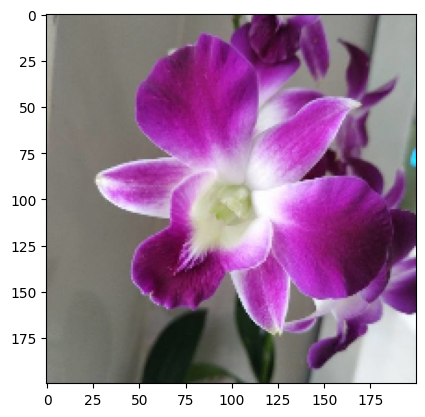

1/1 [==============================] - 0s 111ms/step
7.jpg được dự đoán là: phong lan


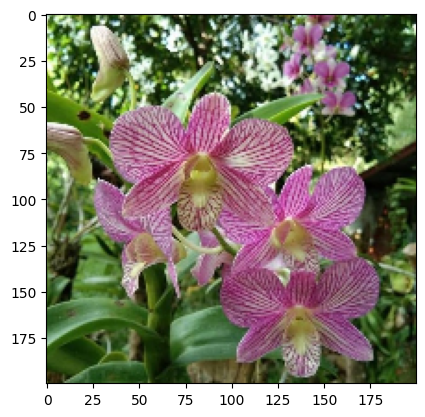

1/1 [==============================] - 0s 45ms/step
2.jpg được dự đoán là: phong lan


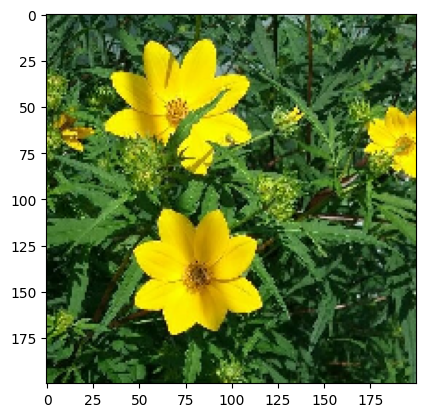

1/1 [==============================] - 0s 47ms/step
15.jpg được dự đoán là: hoa cuc


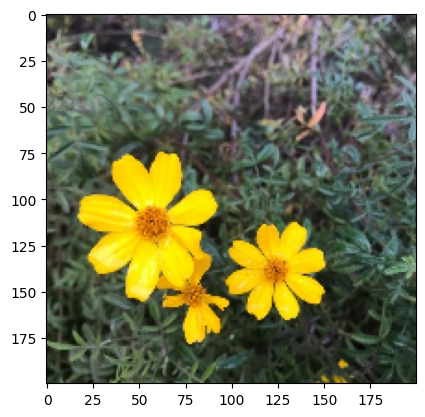

1/1 [==============================] - 0s 51ms/step
10.jpg được dự đoán là: hoa cuc


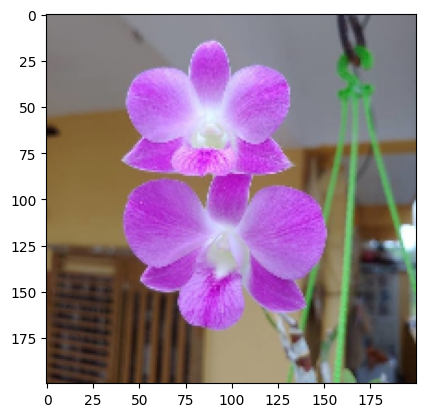

1/1 [==============================] - 0s 52ms/step
6.jpg được dự đoán là: phong lan


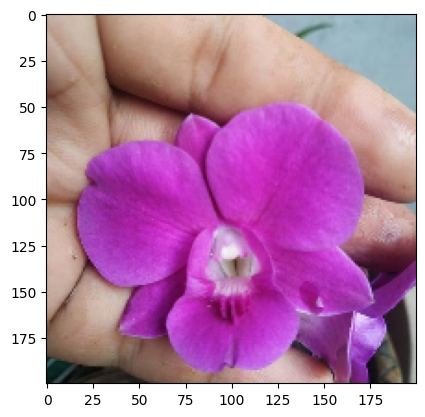

1/1 [==============================] - 0s 70ms/step
8.jpg được dự đoán là: phong lan


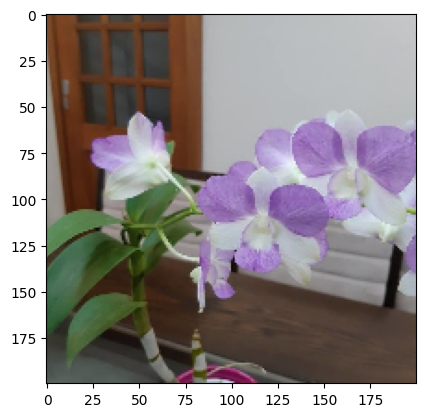

1/1 [==============================] - 0s 66ms/step
1.jpg được dự đoán là: phong lan


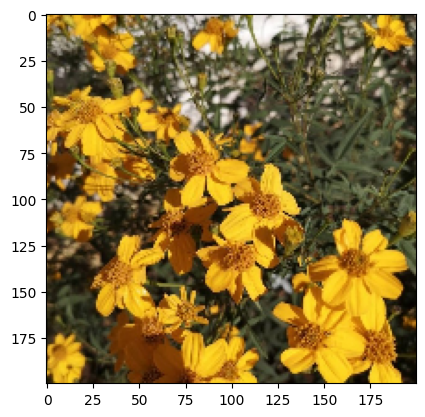

1/1 [==============================] - 0s 66ms/step
4.jpg được dự đoán là: hoa cuc


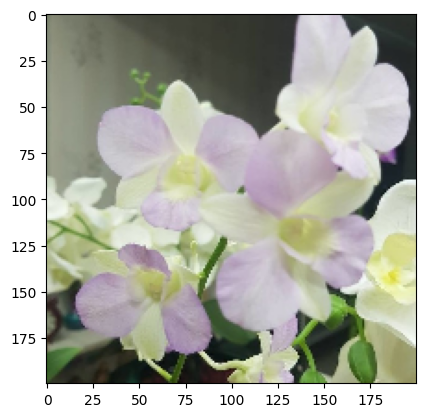

1/1 [==============================] - 0s 65ms/step
3.jpg được dự đoán là: phong lan


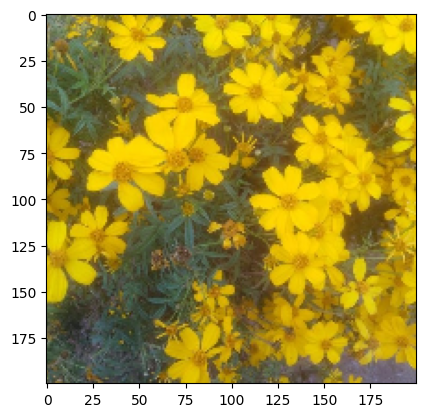

1/1 [==============================] - 0s 118ms/step
9.jpg được dự đoán là: hoa cuc


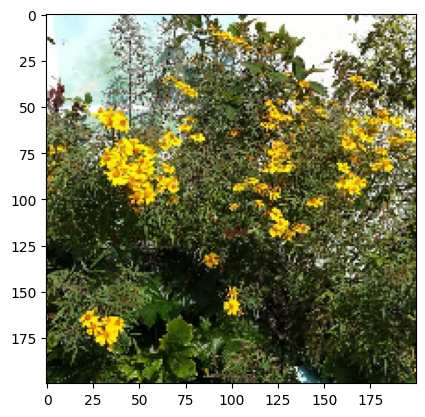

1/1 [==============================] - 0s 111ms/step
12.jpg được dự đoán là: hoa cuc


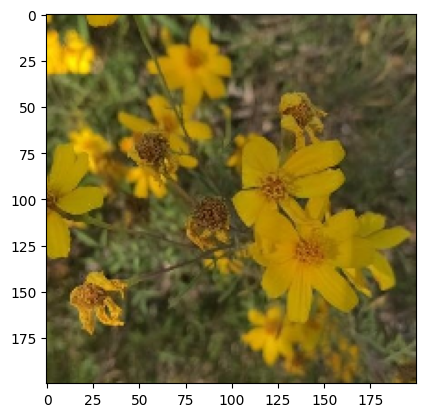

1/1 [==============================] - 0s 68ms/step
5.jpg được dự đoán là: hoa cuc


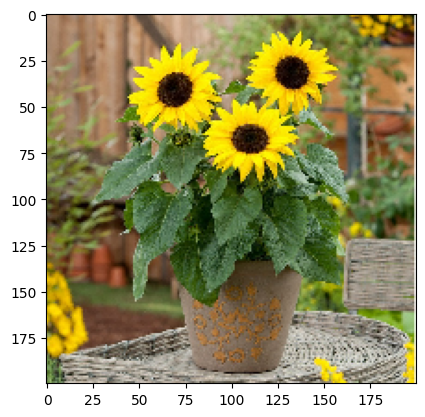

1/1 [==============================] - 0s 167ms/step
18.jpg được dự đoán là: huong duong


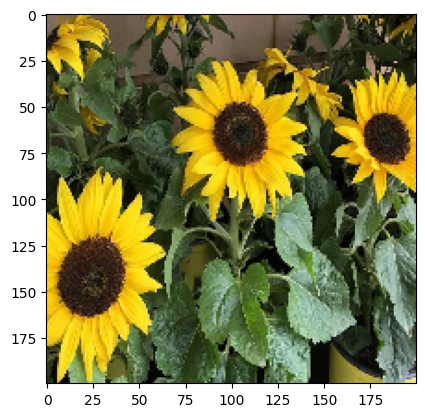

1/1 [==============================] - 0s 90ms/step
14.jpg được dự đoán là: hoa cuc


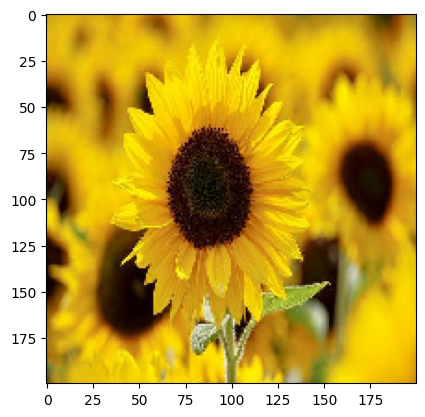

1/1 [==============================] - 0s 92ms/step
19.jpg được dự đoán là: hoa cuc


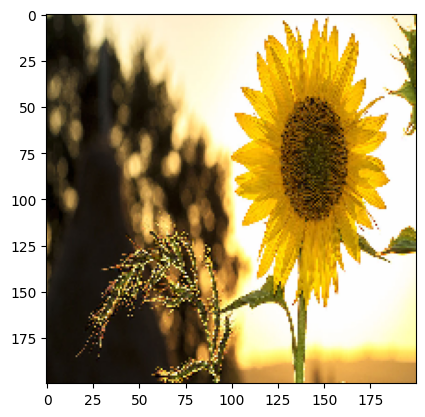

1/1 [==============================] - 0s 123ms/step
13.jpg được dự đoán là: hoa cuc


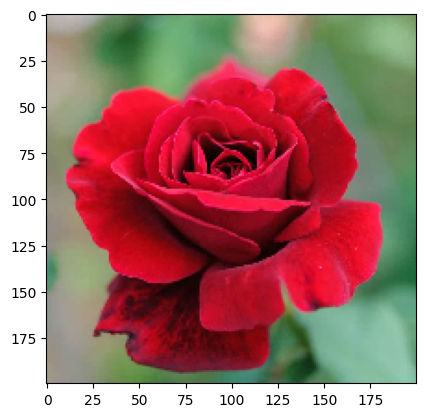

1/1 [==============================] - 0s 172ms/step
11.jpg được dự đoán là: hoa hong


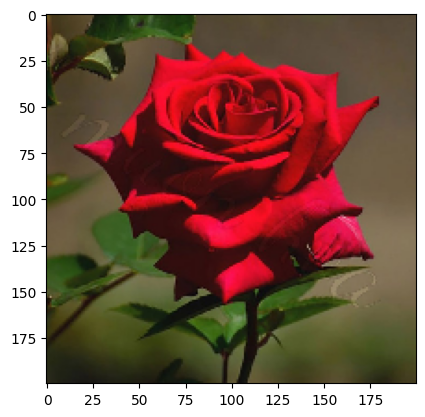

1/1 [==============================] - 0s 88ms/step
21.jpg được dự đoán là: hoa hong


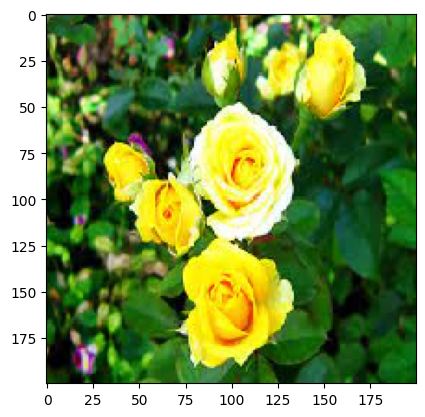

1/1 [==============================] - 0s 65ms/step
20.jpg được dự đoán là: hoa cuc


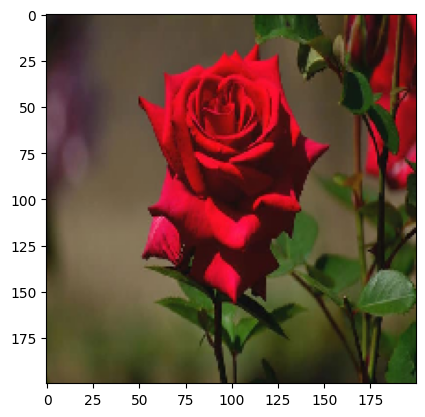

1/1 [==============================] - 0s 59ms/step
17.jpg được dự đoán là: hoa hong


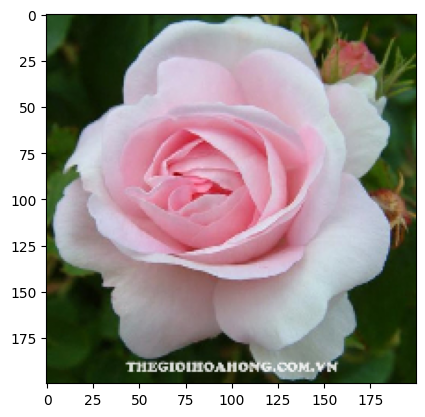

1/1 [==============================] - 0s 77ms/step
16.jpg được dự đoán là: phong lan


In [ ]:
dir_path = '/content/drive/MyDrive/dataset2/test'

for i in os.listdir(dir_path):
    img = image.load_img(os.path.join(dir_path, i), target_size=(200, 200))
    plt.imshow(img)
    plt.show()

    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    val = model.predict(img)

    predicted_class = np.argmax(val)  # Lấy chỉ số của lớp có xác suất cao nhất
    label_mapping = {0: 'hoa cuc', 1: 'phong lan', 2: 'hoa hong', 3: 'huong duong'}  # Thay thế bằng mapping của các class trong mô hình của bạn
    predicted_label = label_mapping[predicted_class]  # Lấy tên lớp tương ứng với chỉ số dự đoán

    print(f'{i} được dự đoán là: {predicted_label}')


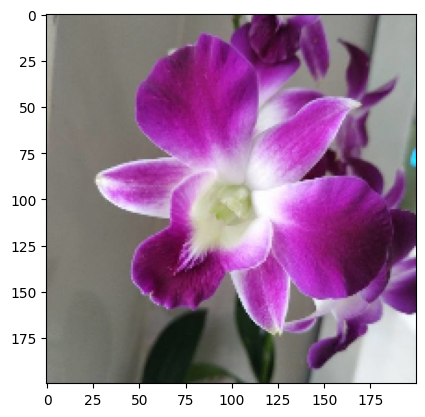

1/1 [==============================] - 0s 104ms/step
7.jpg được dự đoán là: phong lan


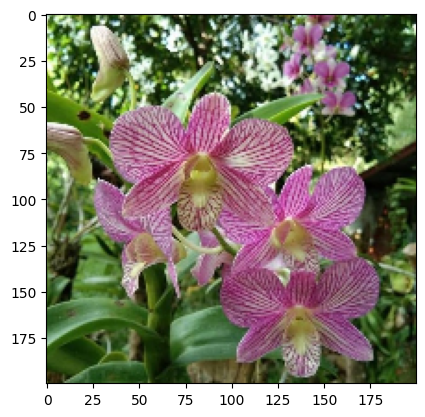

1/1 [==============================] - 0s 45ms/step
2.jpg được dự đoán là: phong lan


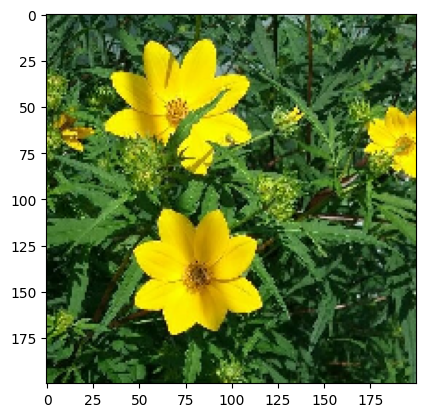

1/1 [==============================] - 0s 57ms/step
15.jpg được dự đoán là: hoa cuc


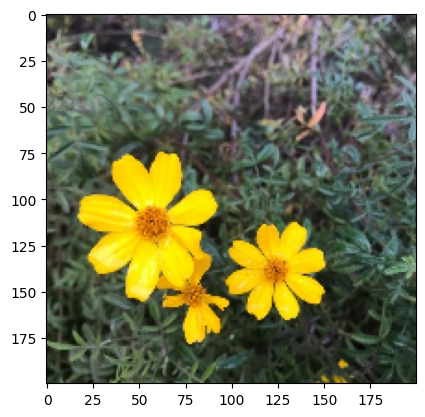

1/1 [==============================] - 0s 45ms/step
10.jpg được dự đoán là: hoa cuc


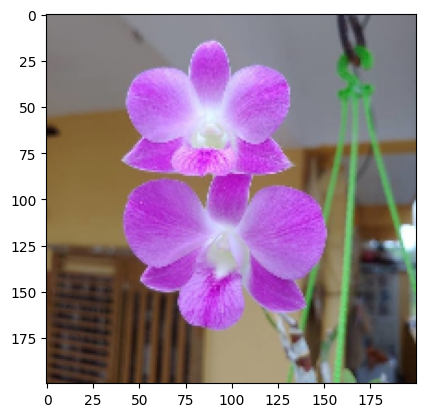

1/1 [==============================] - 0s 44ms/step
6.jpg được dự đoán là: phong lan


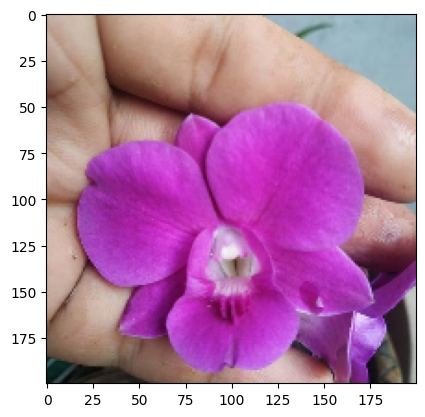

1/1 [==============================] - 0s 50ms/step
8.jpg được dự đoán là: phong lan


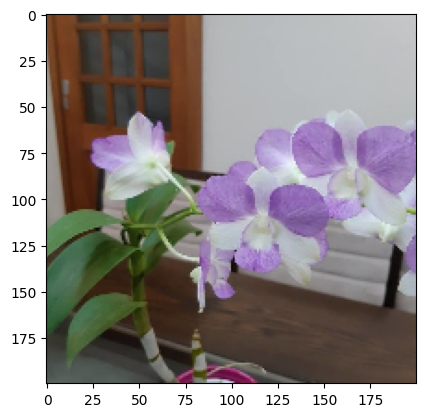

1/1 [==============================] - 0s 54ms/step
1.jpg được dự đoán là: phong lan


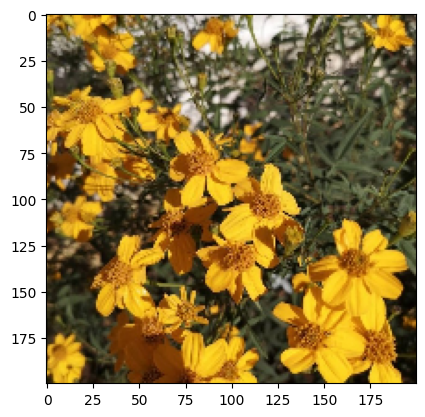

1/1 [==============================] - 0s 45ms/step
4.jpg được dự đoán là: hoa cuc


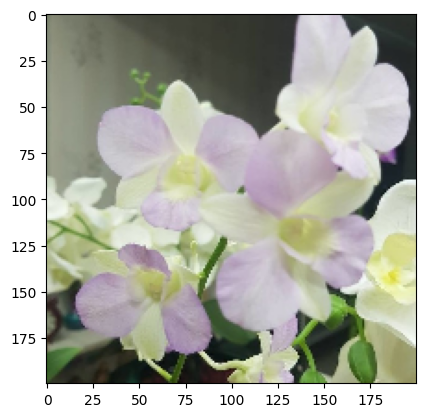

1/1 [==============================] - 0s 47ms/step
3.jpg được dự đoán là: phong lan


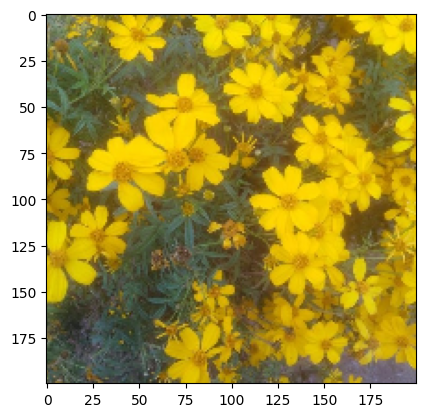

1/1 [==============================] - 0s 53ms/step
9.jpg được dự đoán là: hoa cuc


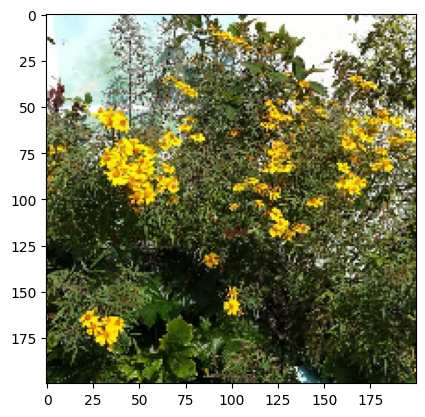

1/1 [==============================] - 0s 52ms/step
12.jpg được dự đoán là: hoa cuc


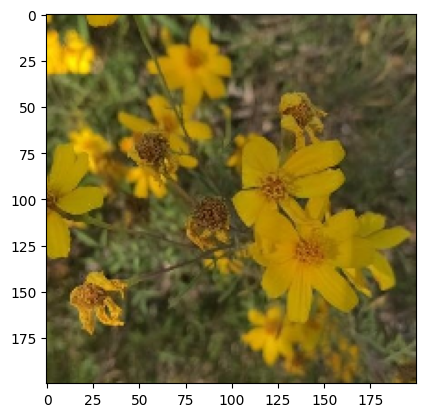

1/1 [==============================] - 0s 50ms/step
5.jpg được dự đoán là: hoa cuc


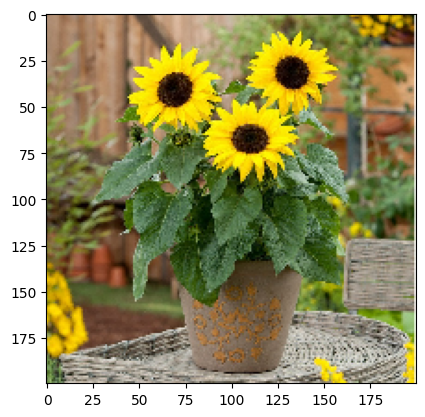

1/1 [==============================] - 0s 70ms/step
18.jpg được dự đoán là: huong duong


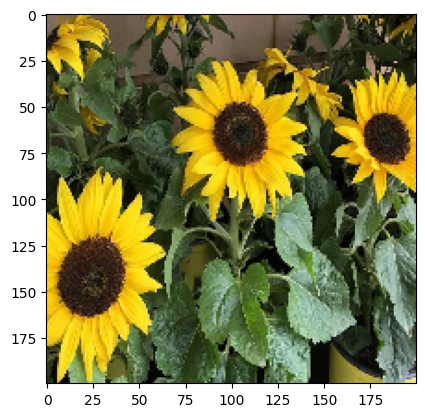

1/1 [==============================] - 0s 76ms/step
14.jpg được dự đoán là: hoa cuc


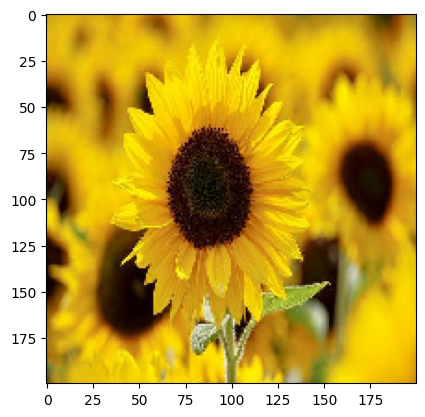

1/1 [==============================] - 0s 72ms/step
19.jpg được dự đoán là: hoa cuc


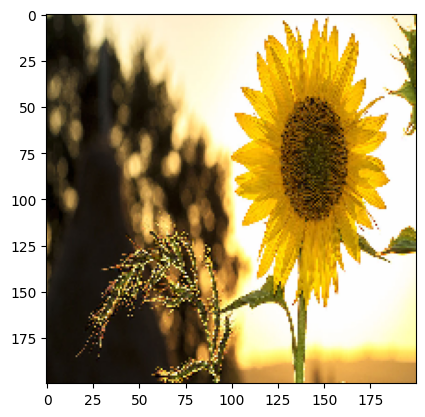

1/1 [==============================] - 0s 84ms/step
13.jpg được dự đoán là: hoa cuc


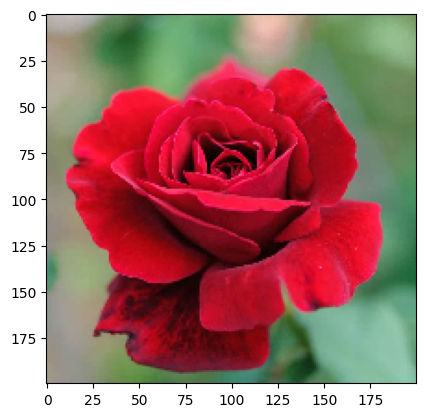

1/1 [==============================] - 0s 88ms/step
11.jpg được dự đoán là: hoa hong


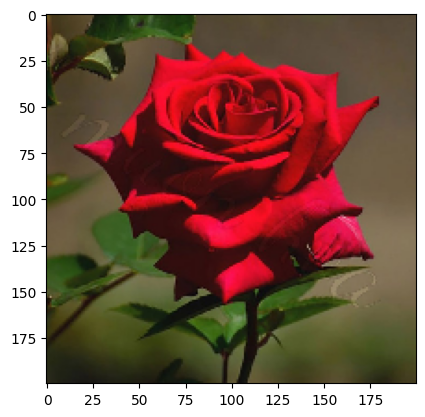

1/1 [==============================] - 0s 103ms/step
21.jpg được dự đoán là: hoa hong


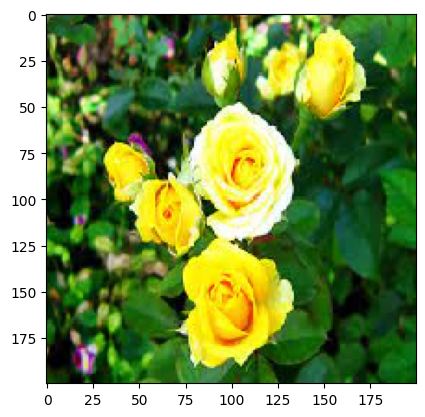

1/1 [==============================] - 0s 63ms/step
20.jpg được dự đoán là: hoa cuc


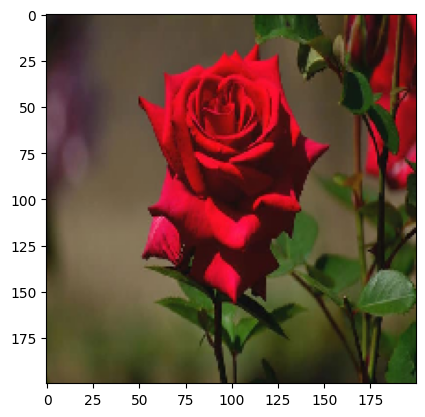

1/1 [==============================] - 0s 75ms/step
17.jpg được dự đoán là: hoa hong


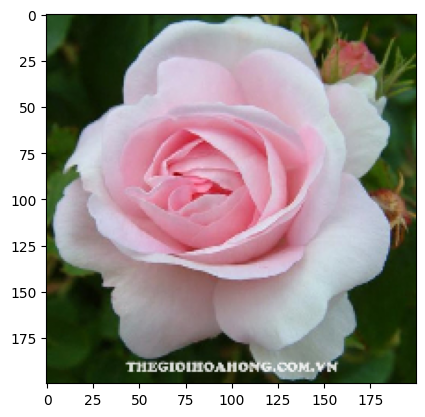

1/1 [==============================] - 0s 74ms/step
16.jpg được dự đoán là: phong lan


In [ ]:
import tkinter as tk
from tkinter import filedialog
from PIL import Image, ImageTk
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import numpy as np
import cv2

# Load mô hình
model = load_model('/content/model.h5')
model.load_weights('/content/my_model_weights.h5')

label_mapping = {0: 'Hoa cuc', 1: 'Phong lan', 2: 'Hoa hong', 3: 'Huong duong'}  # Thay thế bằng mapping của các class trong mô hình của bạn

def predict(image_path):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (200, 200))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    prediction = model.predict(img)

    predicted_class = np.argmax(prediction)  # Lấy class có xác suất cao nhất
    predicted_label = label_mapping[predicted_class]  # Lấy label tương ứng với class

    return predicted_label  # Trả về label dự đoán

dir_path = '/content/drive/MyDrive/dataset2/test'

for i in os.listdir(dir_path):
    img = image.load_img(os.path.join(dir_path, i), target_size=(200, 200))
    plt.imshow(img)
    plt.show()

    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    val = model.predict(img)

    predicted_class = np.argmax(val)  # Lấy chỉ số của lớp có xác suất cao nhất
    label_mapping = {0: 'hoa cuc', 1: 'phong lan', 2: 'hoa hong', 3: 'huong duong'}  # Thay thế bằng mapping của các class trong mô hình của bạn
    predicted_label = label_mapping[predicted_class]  # Lấy tên lớp tương ứng với chỉ số dự đoán

    print(f'{i} được dự đoán là: {predicted_label}')